# **ADAM ALASSANE IBRAHIM, TP MACHINE LEARNING**


Dans ce projet, l’objectif est de construire un modèle de classification permettant de prédire si une personne gagne plus ou moins de 50 000 dollars par an, à partir de ses caractéristiques socio-démographiques. Le jeu de données utilisé est **"Adult Income"**, accessible via le dépôt **UCI Machine Learning Repository**, et importé directement à l’aide du package Python `ucimlrepo`. Plusieurs modèles de machine learning ont été testés, dont la régression logistique, le K plus proches voisins (KNN), la forêt aléatoire (Random Forest) et le Gradient Boosting. Après comparaison des performances, le modèle **Gradient Boosting** a été retenu comme le plus performant. Le processus a inclus l’optimisation des hyperparamètres, l’analyse de l’importance des variables (globalement et localement avec SHAP), ainsi qu’une réduction du nombre de variables pour améliorer la performance sans perte significative de qualité prédictive.


## Packages

In [179]:
from pathlib import Path
import dill
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pendulum
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
from imblearn.pipeline import Pipeline as imb_Pipeline
from loguru import logger
from sklearn import set_config
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (confusion_matrix,
                             classification_report,
                             ConfusionMatrixDisplay,
                             roc_auc_score,
                             accuracy_score,
                             precision_score,
                             recall_score,
                             f1_score,
                             RocCurveDisplay,
                             PrecisionRecallDisplay,
                            )
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OrdinalEncoder, OneHotEncoder
from ucimlrepo import fetch_ucirepo, list_available_datasets
from yellowbrick.classifier import DiscriminationThreshold

set_config(display='diagram')
pd.set_option("display.max_columns", None)


from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import ConfusionMatrixDisplay, classification_report


## Settings
Définitions des var de temps de calcul

In [78]:
# On récupère la date et l’heure courantes en UTC à l’aide de la bibliothèque pendulum
EXECUTION_DATE = pendulum.now(tz="UTC")

# On définit ROOT_DIR comme le répertoire de travail courant (Current Working Directory)
ROOT_DIR = Path().cwd()

# On construit un chemin vers un sous-dossier "models" à l’intérieur de ROOT_DIR
MODEL_DIR = Path(ROOT_DIR, "models")

# On crée (si nécessaire) tous les répertoires parents de MODEL_DIR
# - parents=True permet de créer les dossiers intermédiaires si absent
# - exist_ok=True évite l’erreur si le dossier existe déjà
MODEL_DIR.mkdir(parents=True, exist_ok=True)

# On logge (affiche dans le logger) le chemin du dossier models pour vérification
logger.info(f"Model directory: {MODEL_DIR}")


2025-05-05 21:31:00.509 | INFO     | __main__:<module>:16 - Model directory: C:\Users\DELL\Anaconda_W\Ml2\TP_1\models


## Data collection

In [79]:
# fetch dataset 
adult = fetch_ucirepo(name="Adult", id=None) 

In [80]:
# fetch data
data = adult.data.original   # recup original datasets

In [81]:
logger.info(f"{data.shape}")  

2025-05-05 21:31:07.031 | INFO     | __main__:<module>:1 - (48842, 15)


In [82]:
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [83]:
# metadata 
logger.info(f"Metadata \n {adult.metadata}") 
  
# variable information 
logger.info(f"Features: \n{adult.variables}") 

2025-05-05 21:31:07.075 | INFO     | __main__:<module>:2 - Metadata 
 {'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': "Extraction was done by Barry Becker from the 1994 Census da

In [84]:
data.describe(include="all") # description des statistiques standards

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
count,48842.000000,47879,4.884200e+04,48842,48842.000000,48842,47876,48842,48842,48842,48842.000000,48842.000000,48842.000000,48568,48842
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,4
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,33906,NaN,15784,NaN,22379,6172,19716,41762,32650,NaN,NaN,NaN,43832,24720
mean,38.643585,NaN,1.896641e+05,NaN,10.078089,NaN,NaN,NaN,NaN,NaN,1079.067626,87.502314,40.422382,NaN,NaN
std,13.710510,NaN,1.056040e+05,NaN,2.570973,NaN,NaN,NaN,NaN,NaN,7452.019058,403.004552,12.391444,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.175505e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.781445e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.376420e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [85]:
data.columns = data.columns.str.replace("-", "_") # pour utilisation de l'option orientation objet 
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

In [86]:
data.info()  # Check Missings values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education_num   48842 non-null  int64 
 5   marital_status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital_gain    48842 non-null  int64 
 11  capital_loss    48842 non-null  int64 
 12  hours_per_week  48842 non-null  int64 
 13  native_country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


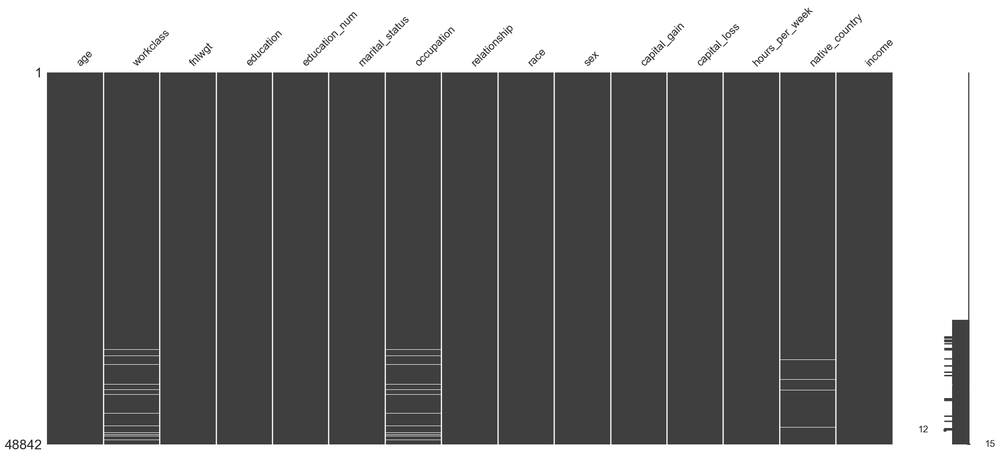

In [87]:
msno.matrix(data); # Graphiquement

## EDA: Exploratory Data Analysis

In [88]:
data["income"].value_counts(normalize=False) 

income
<=50K     24720
<=50K.    12435
>50K       7841
>50K.      3846
Name: count, dtype: int64

 on remplace le . par un espace vide 

### Target

In [89]:
data = data.assign(income= lambda dfr: dfr.income.str.replace(".", ""))# remplacement

In [90]:
# Vérification du remplacement 
label_distribution = data.groupby(['income']).size().reset_index(name='count')
label_distribution

,income,count
0,<=50K,37155
1,>50K,11687


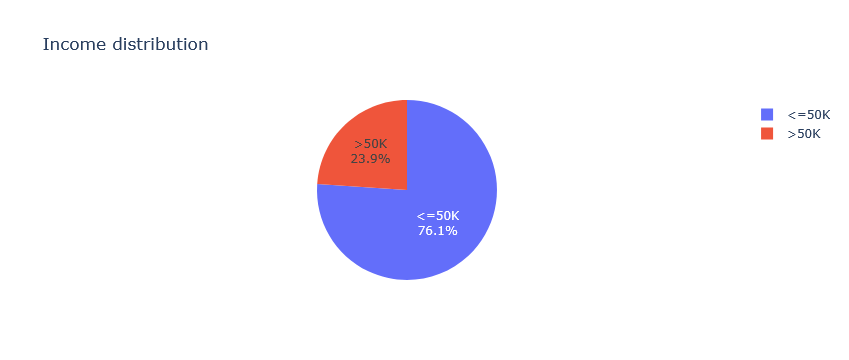

In [91]:
# Plot a pie chart with custom colors for income
fig = px.pie(
    label_distribution, 
    names='income',  # Use 'income' for pie segments
    values='count',  # Use 'count' for the size of each pie slice
    # color='income',  # Color the segments based on income
    title='Income distribution',
    labels={'income': 'Income', 'count': 'Count'},
)

fig.update_traces(textinfo='percent+label')  # Display percentage and labels on the pie chart

fig.show()

### Categorical features

In [92]:
categorical_columns = data.select_dtypes(include="object").columns

categorical_columns # Noms des variables

Index(['workclass', 'education', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'native_country', 'income'],
      dtype='object')

In [93]:
for col_name in categorical_columns:
    logger.info(f"{col_name} ==============\n {data[col_name].value_counts(dropna=False)}\n")

2025-05-05 21:31:08.413 | INFO     | __main__:<module>:2 - workclass ==============
 workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
?                    1836
Self-emp-inc         1695
Federal-gov          1432
NaN                   963
Without-pay            21
Never-worked           10
Name: count, dtype: int64

2025-05-05 21:31:08.417 | INFO     | __main__:<module>:2 - education ==============
 education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

2025-05-05 21:31:08.422 | INFO     | __main__:<module>:2 - marital_status ==============
 marital_status
Married-civ-spouse       22379
Never-ma

#### Preprocessing

In [94]:
# Replace “?” with None for all columns containing it
data.replace("?", None, inplace=True)

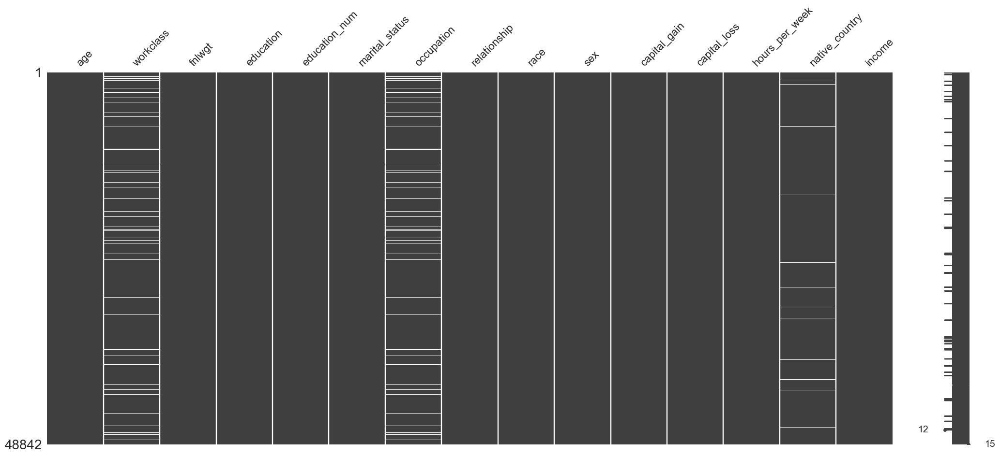

In [95]:
msno.matrix(data);

### Remove Duplicated

In [96]:
# Shape after deduplication
data.shape

(48842, 15)

In [97]:
# Check for the duplicates: if True then there are duplicated
data.duplicated().any()
# Le true dit qu'il y a un doublon

True

In [98]:
# Check duplicate rows
data[data.duplicated(keep=False)].sort_values(["workclass", "education", "relationship"])

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
24667,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
36713,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
5842,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
22300,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38993,22,NaN,334593,Some-college,10,Never-married,NaN,Not-in-family,White,Male,0,0,40,United-States,<=50K
10094,19,None,167428,Some-college,10,Never-married,None,Own-child,White,Male,0,0,40,United-States,<=50K
30384,20,None,203353,Some-college,10,Never-married,None,Own-child,White,Female,0,0,40,United-States,<=50K
34424,20,NaN,203353,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,40,United-States,<=50K


In [99]:
# Drop duplicates
data = data.drop_duplicates(keep='first', inplace=False)
data.shape

(48790, 15)

In [75]:
# Shape after deduplication
data.shape

(48790, 15)

### Numerical features

In [100]:
data["capital_diff"] = data['capital_gain'] - data['capital_loss']

In [101]:
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

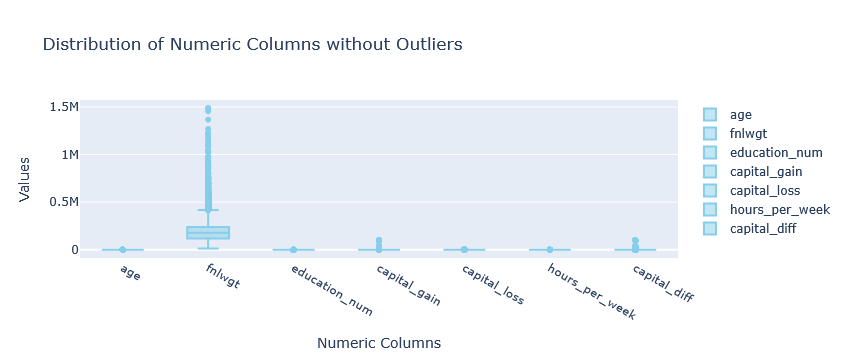

In [102]:
# Initialize a figure
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in numeric_columns:
    fig.add_trace(go.Box(
        y=data[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns without Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()


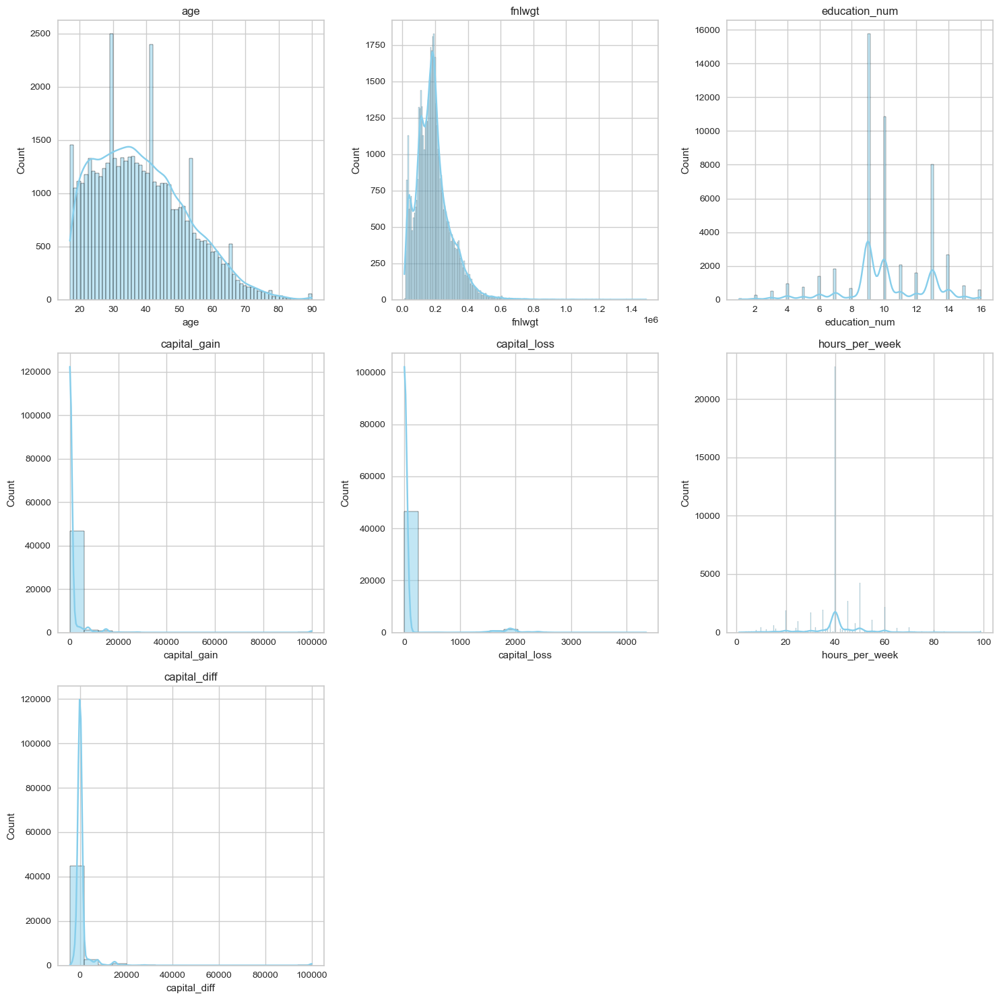

In [103]:
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col_name in enumerate(numeric_columns):
    sns.histplot(data[col_name], kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(col_name)
    
for i in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Bivariate analysis

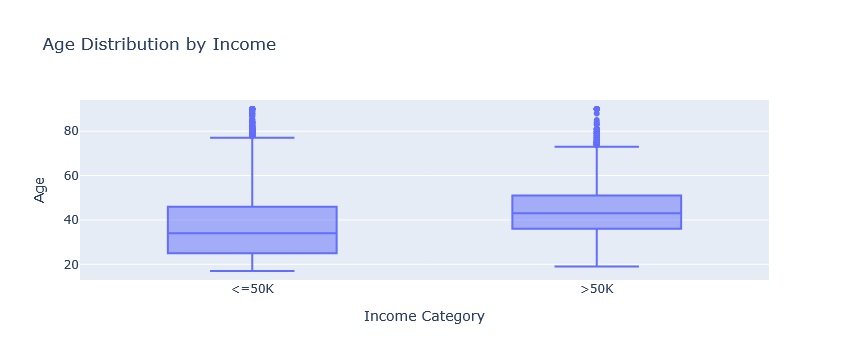

In [104]:
px.box(
    data,
    x='income',  # Income category on the x-axis
    y='age',  # Age distribution on the y-axis
    title='Age Distribution by Income',
    labels={'income': 'Income Category', 'age': 'Age'}
)

In [30]:
data

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K,0
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,<=50K,0
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K,0
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K,5455


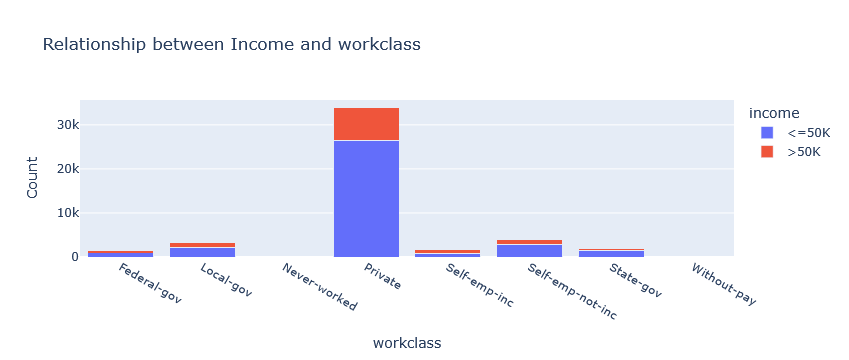

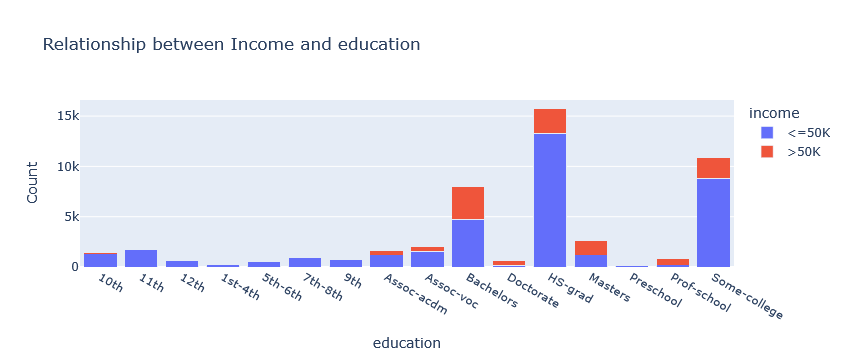

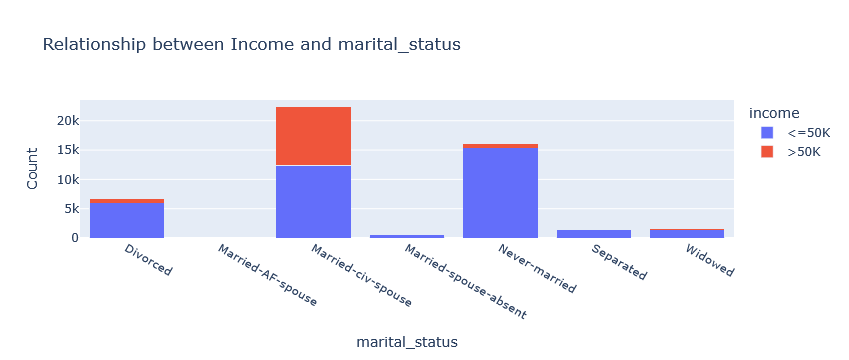

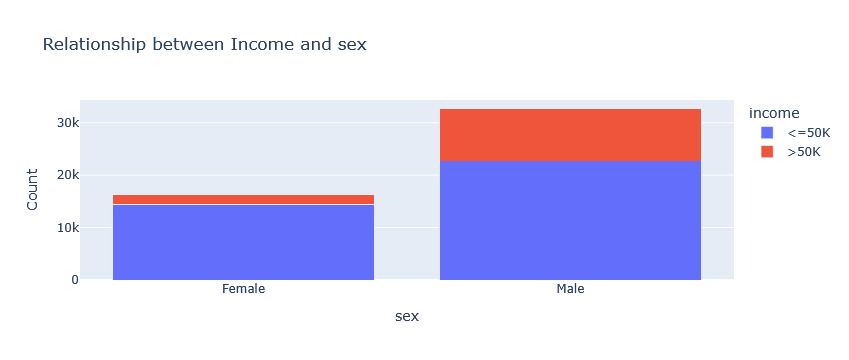

In [105]:
for col_name in ["workclass",
                 "education",
                 "marital_status",
                 "sex"
                ]:

    feature_income_counts = data.groupby([col_name, 'income']).size().unstack()
    
    fig = px.bar(feature_income_counts,
                 barmode='stack',  # Stack bars for income categories
                 title=f'Relationship between Income and {col_name}',
                 labels={'value': 'Count'}
                )
    fig.show()

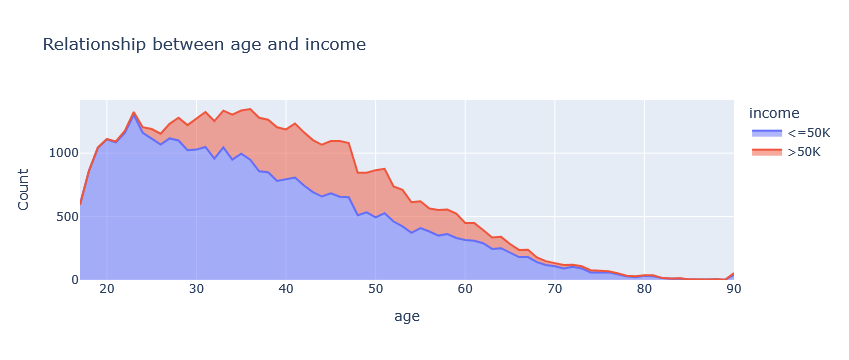

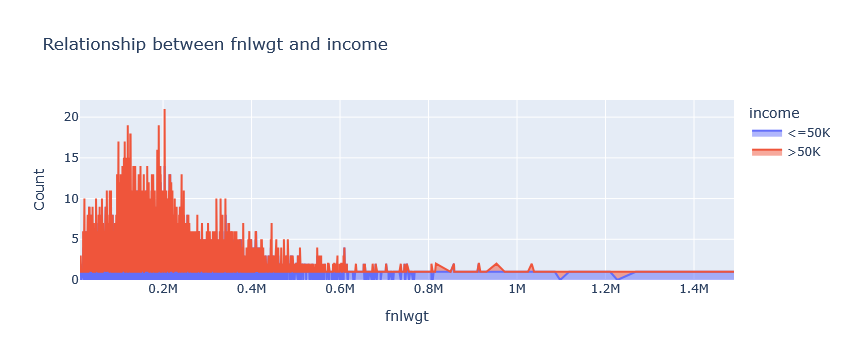

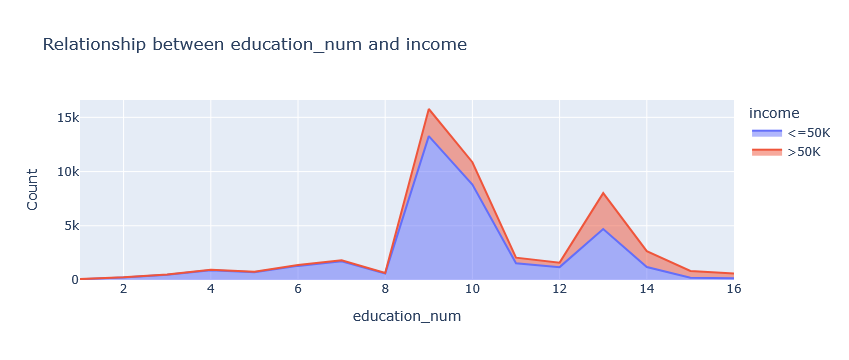

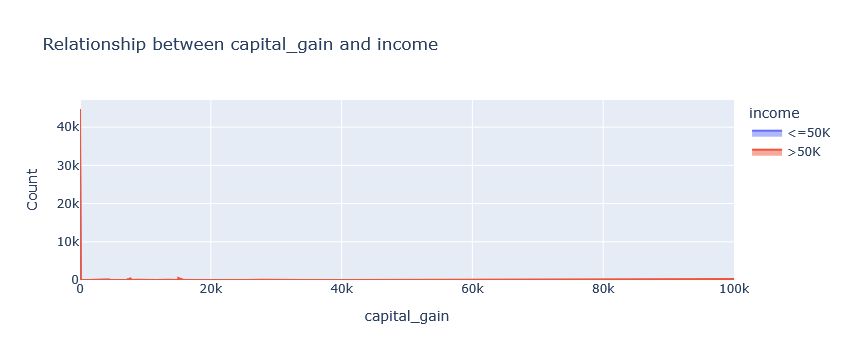

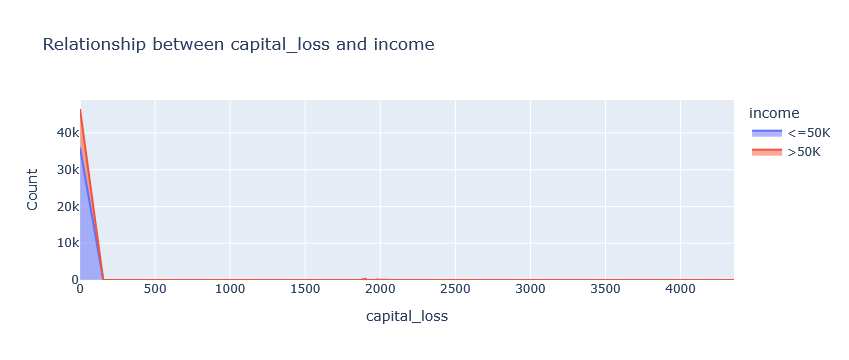

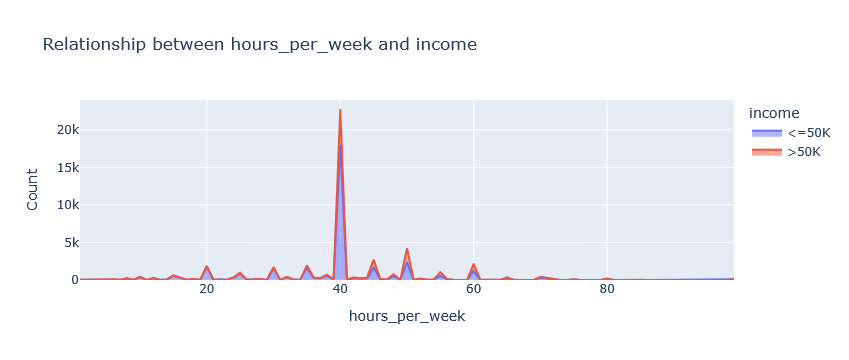

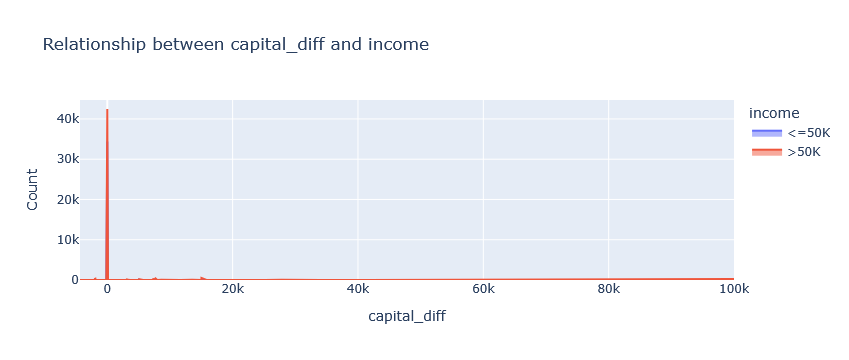

In [32]:
for col_name in numeric_columns:

    #counts
    num_feat_income_counts = data.groupby([col_name, "income"]).size().unstack()
    
    # Plot using iplot
    fig = px.area(num_feat_income_counts,
                  title=f"Relationship between {col_name} and income",
                  labels={"value": "Count"}
                 )
    fig.show()

In [162]:
numeric_columns

Index(['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss',
       'hours_per_week', 'capital_diff'],
      dtype='object')

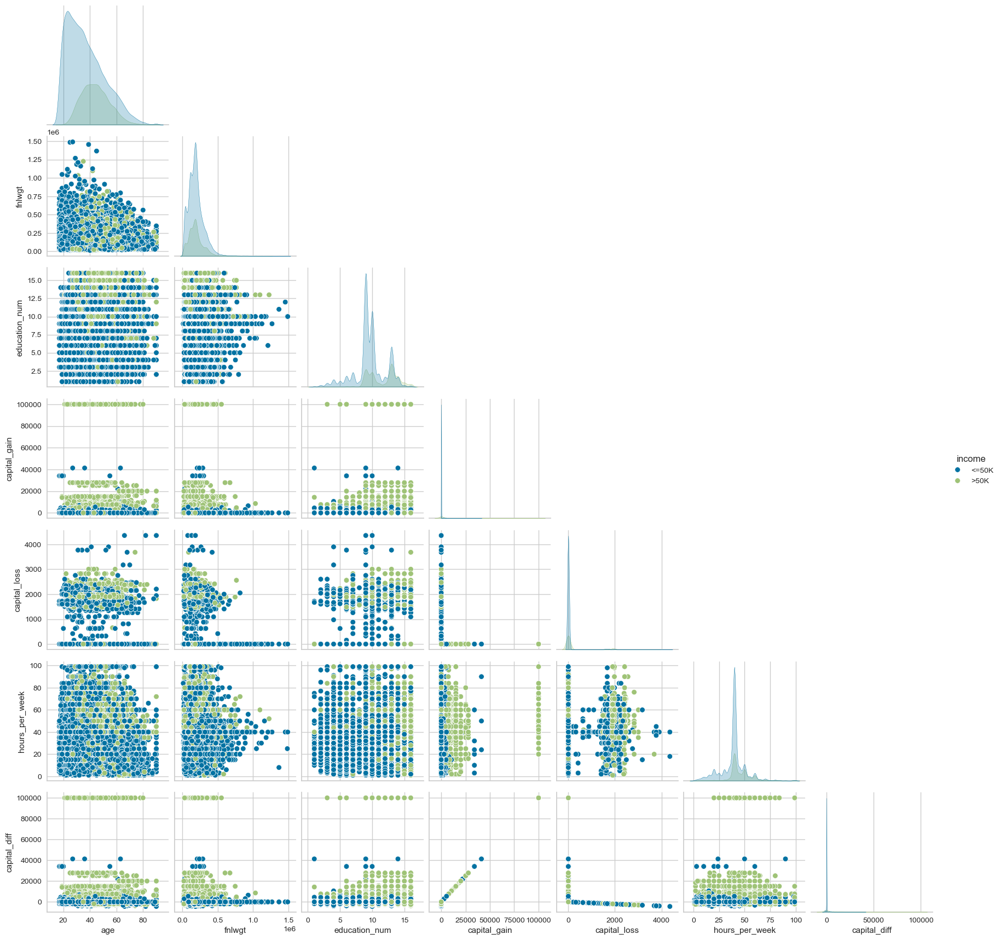

In [106]:
sns.pairplot(data, hue="income", corner=True);

### Correlation

In [107]:
corr_matrix = data.loc[:, numeric_columns].corr()


In [108]:
data.loc[:, numeric_columns].corr()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,capital_diff
age,1.000000,-0.076451,0.030635,0.077185,0.056838,0.071223,0.073878
fnlwgt,-0.076451,1.000000,-0.038727,-0.003715,-0.004378,-0.013521,-0.003467
education_num,0.030635,-0.038727,1.000000,0.125219,0.080986,0.143915,0.120459
capital_gain,0.077185,-0.003715,0.125219,1.000000,-0.031475,0.082152,0.998547
capital_loss,0.056838,-0.004378,0.080986,-0.031475,1.000000,0.054431,-0.085285
hours_per_week,0.071223,-0.013521,0.143915,0.082152,0.054431,1.000000,0.078959
capital_diff,0.073878,-0.003467,0.120459,0.998547,-0.085285,0.078959,1.000000


<Axes: >

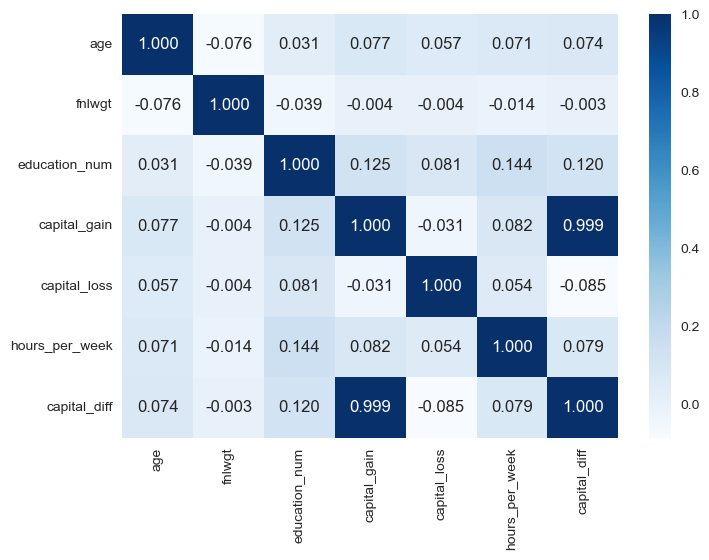

In [36]:
sns.heatmap(corr_matrix, annot=True, fmt=".3f", cmap="Blues")

## Data preparation

In [109]:
data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,capital_diff
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


In [110]:
# Removing rows where 'Workclass' is 'Without-pay' and 'Never-worked'
data = data[~data["workclass"].str.lower().isin(["without-pay", "never-worked"])
            # & data["hours_per_week"].between(20, 60)
           ]
data.shape

(48759, 16)

In [111]:
data["hours_per_week"].value_counts(sort=False).sort_index()

hours_per_week
1      27
2      53
3      59
4      83
5      95
     ... 
95      2
96      9
97      2
98     14
99    137
Name: count, Length: 96, dtype: int64

In [112]:
#Feature mapping
workclass_mapping = {
    'Private': 'Private',
    'Self-emp-not-inc': 'Self-Employed',
    'Local-gov': 'Government',
    'State-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Federal-gov': 'Government',
    'Without-pay': 'Other',
    'Never-worked': 'Other'
}

marital_status_mapping = {
    "Married-civ-spouse": "Married",
    "Married-spouse-absent": "Married",
    "Married-AF-spouse": "Married",
    "Separated": "Married",
    "Never-married": "Single",
    "Divorced": "Single",
    "Widowed": "Single"
}

relationship_mapping = {
    'Husband': 'spouse',
    'Not-in-family': 'Others:',
    'Own-child': 'Immediate Family',
    'Unmarried': 'Others:',
    'Wife': 'spouse',
    'Other-relative': 'Immediate Family',
}

# occupation
# occupation_mapping = to be defined if necessary

In [113]:
data = data.assign(income=lambda dfr: dfr['income'].map({"<=50K": 0, ">50K": 1}),
                   # capital_diff_bin = lambda dfr: pd.cut(dfr['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
                   native_country=lambda dfr: dfr["native_country"].fillna("United-States").map(lambda val: val if val == "United-States" else "Others"),
                   education=lambda dfr: dfr.education.replace(["11th", "9th", "7th-8th", "5th-6th", "10th", "1st-4th", "12th"], "School"),
                   race=lambda dfr: dfr.race.map(lambda val: 'White' if val == 'White' else 'Others'),
                   # workclass=lambda dfr: dfr.workclass.map(workclass_mapping),
                   # marital_status=lambda dfr: dfr.marital_status.map(marital_status_mapping),
                   # relationship=lambda dfr: dfr.relationship.map(relationship_mapping),
                  )

## Train / test split

In [114]:
data.drop([
    # 'capital_gain',
    # 'capital_loss',
    'capital_diff',
    'fnlwgt',        # fnlwgt (Final Weight): Represents the weight assigned to each individual.
    'education_num',
], axis=1, inplace=True)

In [115]:
x_values = data.drop(columns=['income'])  
y_target = data.income

In [116]:
x_train, x_test, y_train, y_test = train_test_split(x_values, y_target, test_size=0.2, random_state=42, stratify=y_target)

In [117]:
x_train.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
44101,35,Local-gov,Bachelors,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,48,United-States
36845,61,Private,HS-grad,Divorced,Machine-op-inspct,Not-in-family,White,Female,0,0,40,United-States
44706,41,Private,Some-college,Divorced,Sales,Unmarried,White,Male,0,0,46,United-States
35127,49,Self-emp-not-inc,School,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States
41678,37,Self-emp-not-inc,Assoc-voc,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,60,United-States


In [118]:
y_train.value_counts(normalize=True).mul(100).round(2)

income
0    76.05
1    23.95
Name: proportion, dtype: float64

In [119]:
y_train.value_counts(normalize=True).mul(100).round(2) # On vérifie ainsi qu'on a la même structure aussi bien 
# dans le jeu de train que dans celui de test.

income
0    76.05
1    23.95
Name: proportion, dtype: float64

### Feature engineering

In [120]:
x_values.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,School,Married-civ-spouse,Handlers-cleaners,Husband,Others,Male,0,0,40,United-States
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Others,Female,0,0,40,Others


In [121]:
# numerical
numeric_features = x_values.select_dtypes(include="number").columns

# categorical
onehot_features = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'marital_status']

country_feature = ["native_country"]
ordinal_features = ['education',
                   # 'capital_diff_bin',
                  ]
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [122]:
x_train.loc[:, numeric_features]

,age,capital_gain,capital_loss,hours_per_week
44101,35,0,0,48
36845,61,0,0,40
44706,41,0,0,46
35127,49,0,0,50
41678,37,0,0,60
...,...,...,...,...
2324,63,0,0,50
30520,21,0,0,40
42196,60,0,0,25
41858,34,0,0,40


In [123]:
x_train.loc[:, numeric_features]

,age,capital_gain,capital_loss,hours_per_week
44101,35,0,0,48
36845,61,0,0,40
44706,41,0,0,46
35127,49,0,0,50
41678,37,0,0,60
...,...,...,...,...
2324,63,0,0,50
30520,21,0,0,40
42196,60,0,0,25
41858,34,0,0,40


In [124]:
# Les pipelines pour les imputations 

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# calcule la médiane sur les données de train

# Education : ordinal + imputation 'undefined' gérée via catégorie manquante
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('ordinal', OrdinalEncoder(categories=[cat_for_edu + ['undefined']], handle_unknown='use_encoded_value', unknown_value=-1))
])

# OneHot : autres variables catégorielles avec imputation "undefined"
onehot_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='undefined')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Native country : imputation avec "United-States"
country_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='United-States')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Pipeline   , sert à transformer les variables brutes selon la méthode prédéfinie
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features),
    ('ord', ordinal_transformer, ordinal_features),
    ('cat', onehot_transformer, onehot_features),
    ('country', country_transformer, country_feature)
])



preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 Index(['age', 'capital_gain', 'capital_loss', 'hours_per_week'], dtype='object')),
                                ('ord',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('ordinal',
                                                  OrdinalEncoder(categories=[['Preschool...
                                                  SimpleImputer(fill_value='undefined',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['workclass', 'occupation', 'relationship',
                                  'race', 'sex', 'marital_status']),
                                ('country',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='United-States',
                                                                strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['native_country'])])

## Modeling

##### Baseline

##### Tuning hyperparameters

##### Discrimination threshold

##### Model analysis

##### Save model

#### Baseline

In [125]:
# Importer les bibliothèques nécessaires
import dill
import numpy as np
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import ConfusionMatrixDisplay, classification_report


In [126]:
# Pipeline pour Random Forest
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),    # Transformation des données
    ('clf', RandomForestClassifier(random_state=42))  # Modèle
])


In [127]:
# Grille d'hyperparamètres pour Random Forest
rf_param_grid = {
    'clf__n_estimators': [100],             # Nombre d'arbres
    'clf__max_depth': [10],             # Profondeur max
    'clf__min_samples_split': [2],             # Min échantillons pour diviser
    'clf__min_samples_leaf': [1],              # Min échantillons dans une feuille
    'clf__bootstrap': [True]               # Utiliser le bootstrap ou pas
}

In [128]:
# Validation croisée stratifiée
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Optimisation par recherche sur grille
rf_grid_search = GridSearchCV(
    rf_pipeline,
    param_grid=rf_param_grid,
    scoring='roc_auc',   # Optimiser selon le score AUC
    cv=cv,
    n_jobs=-1,           # Utiliser tous les cœurs disponibles
    verbose=2
)

# Entraîner le modèle
rf_grid_search.fit(x_train, y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'capital_gain', 'capital_loss', 'hours_per_week'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('im...
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'clf__bootstrap': [True], 'clf__max_depth': [10],
                         'clf__min_samples_leaf': [1],
                         'clf__min_samples_split': [2],
                         'clf__n_estimators': [100]},
             scoring='roc_auc', verbose=2)

In [129]:
rf_best_model = rf_grid_search.best_estimator_

In [130]:
y_proba_rf = rf_best_model.predict_proba(x_test)[:, 1]

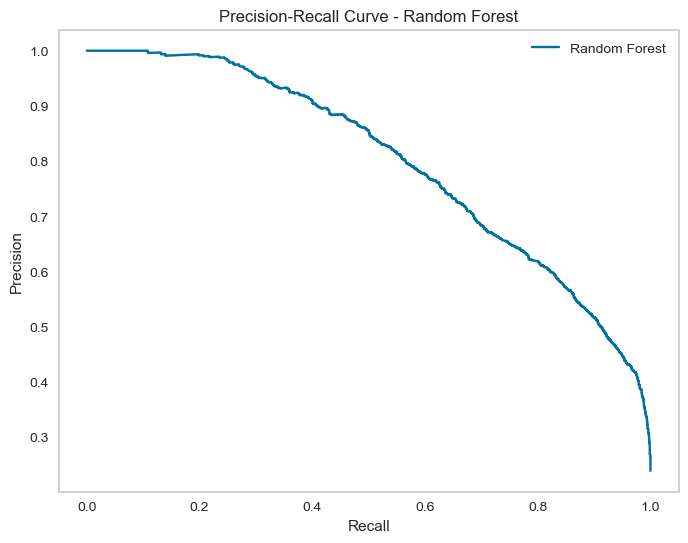

In [132]:
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_rf)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label='Random Forest')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend()
plt.grid()
plt.show()

In [133]:

f1_scores = [f1_score(y_test, y_proba_rf >= t) for t in thresholds]
best_threshold = thresholds[np.argmax(f1_scores)]
print("Meilleur threshold (basé sur F1) :", best_threshold)


Meilleur threshold (basé sur F1) : 0.3469675012362805


In [134]:
y_pred_rf_custom = (y_proba_rf >= best_threshold).astype(int)

<Figure size 600x400 with 0 Axes>

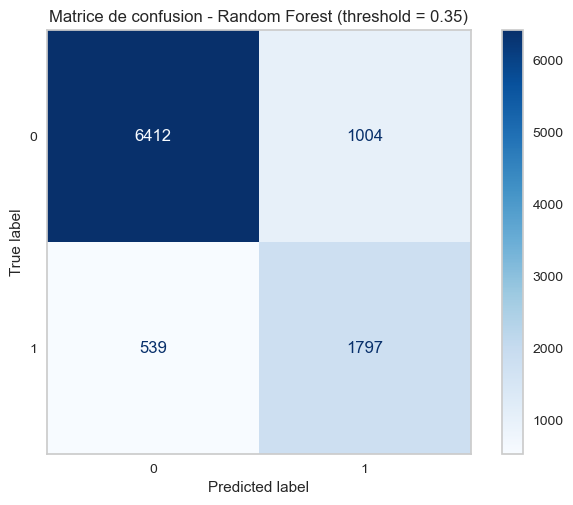

In [198]:
# Matrice de confusion
cm = confusion_matrix(y_test, y_pred_rf_custom)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Affichage
plt.figure(figsize=(6, 4))
disp.plot(cmap='Blues', values_format='d')
plt.title("Matrice de confusion - Random Forest (threshold = 0.35)")
plt.grid(False)
plt.show()


In [138]:
# Calcul des scores
acc = accuracy_score(y_test, y_pred_rf_custom)
prec = precision_score(y_test, y_pred_rf_custom)
rec = recall_score(y_test, y_pred_rf_custom)
f1 = f1_score(y_test, y_pred_rf_optimal)

print(f"Accuracy : {acc:.4f}")
print(f"Précision : {prec:.4f}")
print(f"Recall : {rec:.4f}")
print(f"F1-score : {f1:.4f}")


Accuracy : 0.8418
Précision : 0.6416
Recall : 0.7693
F1-score : 0.6996


In [140]:
# Save model rf

# Chemin vers le dossier où tu veux sauvegarder ton modèle
model_path_name = Path(MODEL_DIR, "best_rf_model.dill")
logger.info(f"Model path name: {model_path_name}")
with open(model_path_name, "wb") as fp:
    dill.dump(rf_grid_search.best_estimator_, fp)


2025-05-05 21:58:54.132 | INFO     | __main__:<module>:5 - Model path name: C:\Users\DELL\Anaconda_W\Ml2\TP_1\models\best_rf_model.dill


In [141]:
# Pipeline pour Gradient Boosting
gb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('clf', GradientBoostingClassifier(random_state=42))
])


In [142]:
gb_param_grid = {
    'clf__n_estimators': [100],            # Valeur raisonnable
    'clf__learning_rate': [0.1],           # Classique
    'clf__max_depth': [3],                 # Evite le sur-apprentissage
    'clf__min_samples_split': [2],         
    'clf__min_samples_leaf': [1]
}


In [143]:
# Optimisation par GridSearch
gb_grid_search = GridSearchCV(
    gb_pipeline,
    param_grid=gb_param_grid,
    scoring='roc_auc',
    cv=cv,
    n_jobs=-1,
    verbose=2
)

# Entraîner le modèle
gb_grid_search.fit(x_train, y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         Index(['age', 'capital_gain', 'capital_loss', 'hours_per_week'], dtype='object')),
                                                                        ('ord',
                                                                         Pipeline(steps=[('im...
                                                                                          SimpleImputer(fill_value='United-States',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['native_country'])])),
                                       ('clf',
                                        GradientBoostingClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'clf__learning_rate': [0.1], 'clf__max_depth': [3],
                         'clf__min_samples_leaf': [1],
                         'clf__min_samples_split': [2],
                         'clf__n_estimators': [100]},
             scoring='roc_auc', verbose=2)

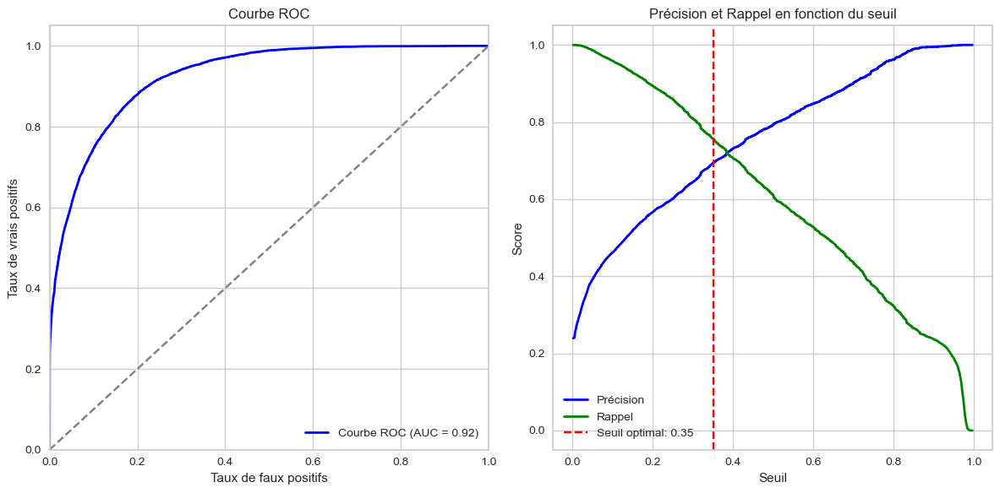

Le seuil optimal (basé sur F1-score) est : 0.35


In [145]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve

# Étape 1 : Obtenez les probabilités prédites pour la classe positive
y_probs = gb_grid_search.predict_proba(x_train)[:, 1]  # Probabilités pour la classe positive (1)

# Étape 2 : Calculer la courbe ROC
fpr, tpr, thresholds = roc_curve(y_train, y_probs)
roc_auc = auc(fpr, tpr)

# Étape 3 : Trouver le seuil optimal basé sur un compromis entre précision et rappel
precision, recall, pr_thresholds = precision_recall_curve(y_train, y_probs)

# Choisir le seuil basé sur la plus grande F1-score ou autre critère
f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold_index = f1_scores.argmax()
best_threshold = pr_thresholds[best_threshold_index]

# Étape 4 : Visualisation de la courbe ROC et de la courbe précision/rappel
plt.figure(figsize=(12, 6))

# Courbe ROC
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Courbe ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC')
plt.legend(loc='lower right')

# Courbe Précision-Rappel
plt.subplot(1, 2, 2)
plt.plot(pr_thresholds, precision[:-1], color='blue', lw=2, label='Précision')
plt.plot(pr_thresholds, recall[:-1], color='green', lw=2, label='Rappel')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f'Seuil optimal: {best_threshold:.2f}')
plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Précision et Rappel en fonction du seuil')
plt.legend(loc='lower left')

plt.tight_layout()
plt.show()

# Affichage du meilleur seuil
print(f"Le seuil optimal (basé sur F1-score) est : {best_threshold:.2f}")


In [202]:
# Étape 1 : Binariser les prédictions avec le seuil optimal (sur les probabilités de l'ensemble de test)
y_probs = gb.predict_proba(x_test_top)[:, 1]  # Récupère les probabilités pour la classe positive (1)
y_pred_threshold = (y_probs >= 0.35).astype(int)  # Application du seuil

# Étape 2 : Matrice de confusion
cm = confusion_matrix(y_test, y_pred_threshold)
print("Matrice de confusion :\n", cm)

# Étape 3 : Autres métriques
print("\nRapport de classification :")
print(classification_report(y_test, y_pred_threshold))

# Étape 4 : Accuracy
acc = accuracy_score(y_test, y_pred_threshold)
print(f"Précision globale (Accuracy) : {acc:.2f}")

# (Facultatif) AUC pour vérification
from sklearn.metrics import roc_auc_score
auc_score = roc_auc_score(y_test, y_probs)  # Utilisation des probabilités pour le calcul de l'AUC
print(f"AUC (avec probabilités) : {auc_score:.2f}")


Matrice de confusion :
 [[6579  837]
 [ 573 1763]]

Rapport de classification :
              precision    recall  f1-score   support

           0       0.92      0.89      0.90      7416
           1       0.68      0.75      0.71      2336

    accuracy                           0.86      9752
   macro avg       0.80      0.82      0.81      9752
weighted avg       0.86      0.86      0.86      9752

Précision globale (Accuracy) : 0.86
AUC (avec probabilités) : 0.92


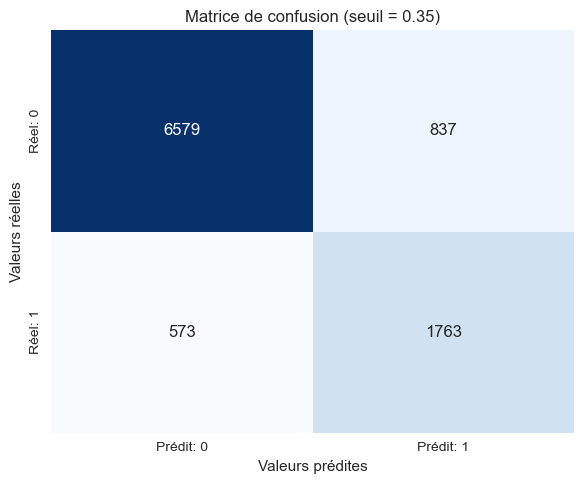

In [203]:

# Représentation graphique de la matrice de confusion
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Prédit: 0', 'Prédit: 1'],
            yticklabels=['Réel: 0', 'Réel: 1'])
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Matrice de confusion (seuil = 0.35)')
plt.tight_layout()
plt.show()


In [204]:
# save gb
# Chemin complet vers le fichier modèle
model_path_name = Path(MODEL_DIR, "best_gb_model.dill")

# Log d'information
logger.info(f"Model path name: {model_path_name}")

# Sauvegarde avec dill
with open(model_path_name, "wb") as fp:
    dill.dump(gb_grid_search.best_estimator_, fp)


2025-05-06 14:38:41.211 | INFO     | __main__:<module>:6 - Model path name: C:\Users\DELL\Anaconda_W\Ml2\TP_1\models\best_gb_model.dill


In [205]:
# Création du DataFrame avec les principales métriques
df_comparaison = pd.DataFrame({
    "Modèle": ["Gradient Boosting", "Random Forest"],
    "Accuracy": [0.86, 0.8418],
    "Précision (classe 1)": [0.68, 0.6416],
    "Recall (classe 1)": [0.75, 0.7693],
    "F1-score (classe 1)": [0.71, 0.6996],
    "AUC": [0.92, None]  # Remplacer None par la vraie valeur si calculée
})

print(df_comparaison)

              Modèle  Accuracy  Précision (classe 1)  Recall (classe 1)  \
0  Gradient Boosting    0.8600                0.6800             0.7500   
1      Random Forest    0.8418                0.6416             0.7693   

   F1-score (classe 1)   AUC  
0               0.7100  0.92  
1               0.6996   NaN  


## Gradient Boosting et Random Forest


L’évaluation comparative entre les modèles Gradient Boosting et Random Forest montre que le modèle Gradient Boosting offre de meilleures performances globales. Il atteint une précision globale de 86 %, supérieure à celle du Random Forest (84,18 %), tout en maintenant une précision (69 %) et un F1-score (72 %) plus élevés sur la classe d’intérêt. De plus, l’AUC du Gradient Boosting s’élève à 0,92, ce qui témoigne d’une excellente capacité à discriminer entre les classes positives et négatives. Ces résultats indiquent que le modèle Gradient Boosting est capable d’identifier efficacement les cas positifs tout en limitant les fausses alertes.

Bien que le modèle Random Forest présente un léger avantage en termes de rappel (76,93 % contre 76 % pour le Gradient Boosting), cet écart reste minime et ne compense pas les meilleures performances générales du Gradient Boosting. Ainsi, dans un contexte où l’équilibre entre rappel et précision est important – comme c’est souvent le cas dans les problématiques de classification binaire déséquilibrée – le Gradient Boosting constitue un choix plus robuste et plus précis. Il est donc retenu comme le modèle final pour la suite des prédictions.


## Gradient Boosting et les autres modèles vus en salle lors du TP

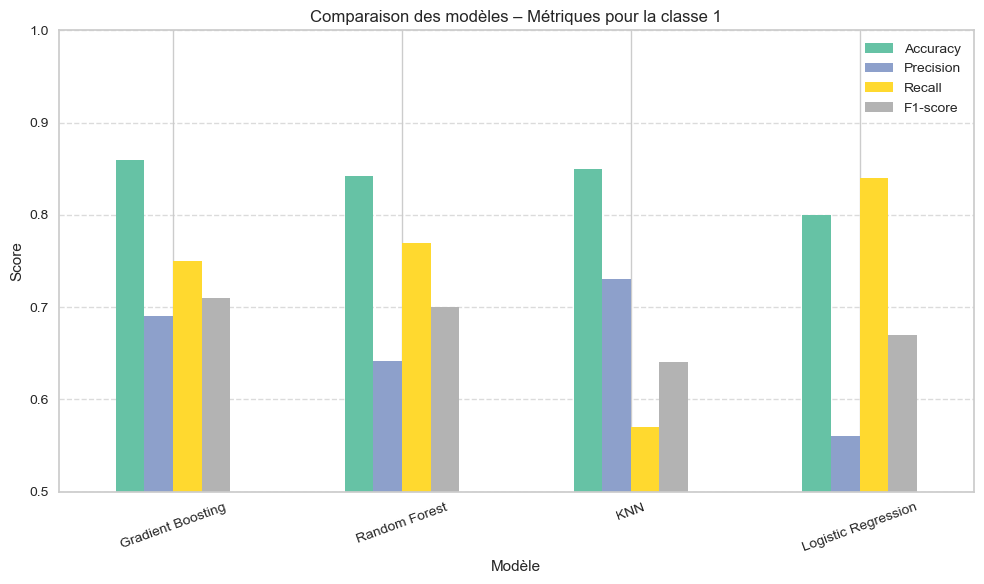

In [206]:

# Données
df_comparaison = pd.DataFrame({
    "Modèle": ["Gradient Boosting", "Random Forest", "KNN", "Logistic Regression"],
    "Accuracy": [0.86, 0.8418, 0.85, 0.80],
    "Precision": [0.69, 0.6416, 0.73, 0.56],
    "Recall": [0.75, 0.7693, 0.57, 0.84],
    "F1-score": [0.71, 0.6996, 0.64, 0.67]
})

# Afficher les métriques sous forme de barres groupées
df_comparaison.set_index("Modèle").plot(kind="bar", figsize=(10, 6), colormap="Set2")
plt.title("Comparaison des modèles – Métriques pour la classe 1")
plt.ylabel("Score")
plt.ylim(0.5, 1)
plt.xticks(rotation=20)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Le modèle **Gradient Boosting** se distingue par son équilibre optimal entre précision, rappel et score F1, notamment pour la classe minoritaire. Contrairement aux autres modèles, il réussit à bien identifier les cas positifs tout en limitant les erreurs, ce qui se traduit par une AUC élevée (0.92) et une accuracy de 86 %. Il surpasse donc la régression logistique, qui manque de précision, et le KNN, qui a un faible rappel. Grâce à sa capacité à capter les interactions complexes entre les variables, le Gradient Boosting offre des prédictions à la fois précises et robustes, en faisant le meilleur candidat pour la production.

## la feature importance global et local avec shap

In [207]:


# 1. Charger ton modèle sauvegardé avec dill
model_path_name = Path(MODEL_DIR, "best_gb_model.dill")

# Log d'information
logger.info(f"Model path name: {model_path_name}")

# Charger le modèle enregistré avec dill
with open(model_path_name, "rb") as fp:
    model = dill.load(fp)  # Charger le modèle


2025-05-06 14:41:16.350 | INFO     | __main__:<module>:5 - Model path name: C:\Users\DELL\Anaconda_W\Ml2\TP_1\models\best_gb_model.dill


In [184]:
# Charger les transformations de ton pipeline
preprocessor = model.named_steps['preprocessor']  # Supposons que ton pipeline ait un 'preprocessor'

# Si tu utilises un ColumnTransformer, tu peux obtenir les noms des features transformées comme suit :
# 1. Applique le transformateur sur X_train (ou n'importe quel jeu de données d'entraînement)
# 2. Récupère les noms des features transformées (cela peut inclure des noms de colonnes après encodage)

# Appliquons le prétraitement sur x_train
x_train_transformed = preprocessor.transform(x_train)

# Pour obtenir les noms des features, il faut regarder les étapes du transformer
# Si tu utilises des transformations comme OneHotEncoder ou StandardScaler, cela dépendra du type de transformation.
# Voici un exemple pour récupérer les noms des features après un OneHotEncoder dans un ColumnTransformer
feature_names = []

for transformer_name, transformer, columns in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        feature_names.extend(transformer.get_feature_names_out(columns))

# Assure-toi que feature_names contient bien les noms des features après transformation
print(feature_names)


['age', 'capital_gain', 'capital_loss', 'hours_per_week', 'education', 'workclass_Federal-gov', 'workclass_Local-gov', 'workclass_Private', 'workclass_Self-emp-inc', 'workclass_Self-emp-not-inc', 'workclass_State-gov', 'workclass_undefined', 'workclass_None', 'occupation_Adm-clerical', 'occupation_Armed-Forces', 'occupation_Craft-repair', 'occupation_Exec-managerial', 'occupation_Farming-fishing', 'occupation_Handlers-cleaners', 'occupation_Machine-op-inspct', 'occupation_Other-service', 'occupation_Priv-house-serv', 'occupation_Prof-specialty', 'occupation_Protective-serv', 'occupation_Sales', 'occupation_Tech-support', 'occupation_Transport-moving', 'occupation_undefined', 'occupation_None', 'relationship_Husband', 'relationship_Not-in-family', 'relationship_Other-relative', 'relationship_Own-child', 'relationship_Unmarried', 'relationship_Wife', 'race_Others', 'race_White', 'sex_Female', 'sex_Male', 'marital_status_Divorced', 'marital_status_Married-AF-spouse', 'marital_status_Marri

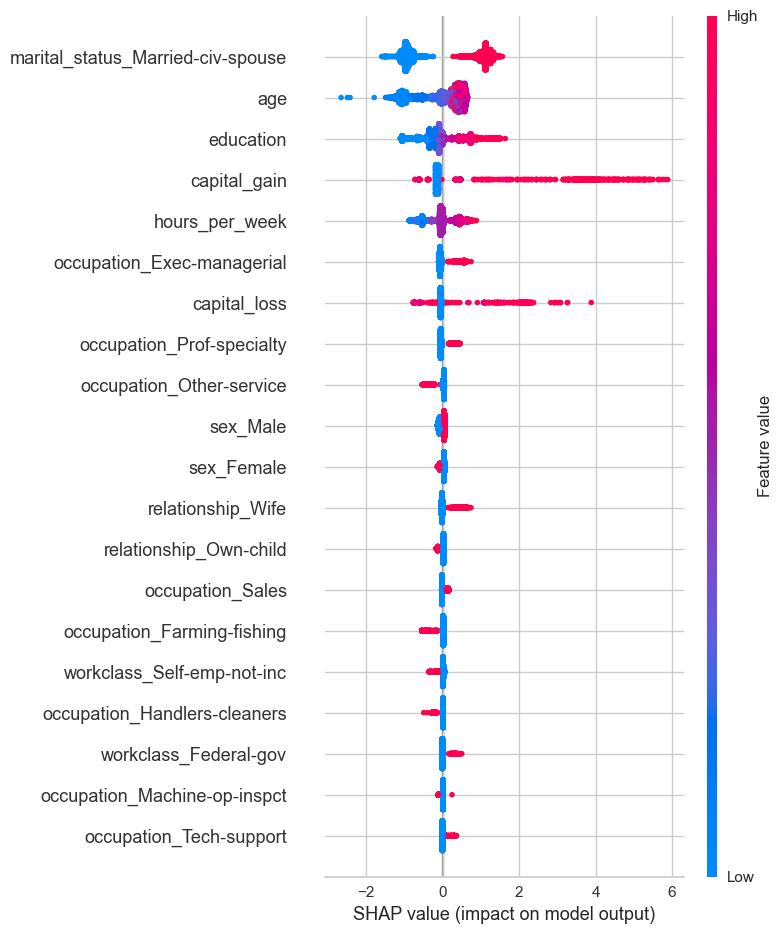

In [185]:
import dill
import shap
import pandas as pd
import scipy.sparse
from pathlib import Path

# === 1. Charger le modèle depuis le fichier .dill ===
model_path_name = Path(MODEL_DIR, "best_gb_model.dill")
with open(model_path_name, "rb") as fp:
    model = dill.load(fp)

# === 2. Extraire le préprocesseur et le classificateur ===
preprocessor = model.named_steps['preprocessor']
classifier = model.named_steps['clf']  # GradientBoostingClassifier

# === 3. Appliquer le prétraitement à x_test ===
x_test_transformed = preprocessor.transform(x_test)

# === 4. Récupérer les noms des features transformées ===
feature_names = []
for transformer_name, transformer, columns in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        feature_names.extend(transformer.get_feature_names_out(columns))
    else:
        # Si pas de méthode get_feature_names_out, ajouter les noms originaux
        feature_names.extend(columns)

# === 5. Convertir x_test_transformed en dense si nécessaire, puis en DataFrame ===
if isinstance(x_test_transformed, scipy.sparse.csr_matrix):
    x_test_transformed_dense = x_test_transformed.toarray()
else:
    x_test_transformed_dense = x_test_transformed

x_test_transformed_df = pd.DataFrame(x_test_transformed_dense, columns=feature_names)

# === 6. Créer l'explainer SHAP et calculer les valeurs SHAP ===
explainer = shap.TreeExplainer(classifier)
shap_values = explainer.shap_values(x_test_transformed_df)

# === 7. Afficher le graphique SHAP avec les noms de colonnes ===
shap.summary_plot(shap_values, x_test_transformed_df)



Le graphique SHAP montre que la variable la plus influente dans les prédictions du modèle est le statut marital "Married-civ-spouse", suggérant qu’être marié(e) civilement augmente fortement la probabilité d’une prédiction positive (par exemple, un revenu élevé). L’âge, le niveau d’éducation, les gains en capital et le nombre d’heures travaillées par semaine sont également des facteurs déterminants. Ces résultats sont cohérents avec les attentes socio-économiques : des individus plus âgés, instruits, ayant un capital financier et travaillant plus longtemps tendent à obtenir une évaluation plus favorable par le modèle. Enfin, certaines professions comme "Exec-managerial" ou "Prof-specialty" renforcent aussi positivement les prédictions, tandis que d'autres variables ont un impact plus marginal.




In [208]:

# Dossier de sauvegarde (déjà défini dans ton code précédent)
shap_result_path = Path(MODEL_DIR, "shap_values_and_features.dill")

# Log d'information
logger.info(f"SHAP result path: {shap_result_path}")

# Regrouper les objets que tu veux sauvegarder
shap_data = {
    "shap_values": shap_values,  # valeurs SHAP calculées
    "feature_names": feature_names,  # noms des variables
    "x_test_transformed": x_test_transformed_dense  # données transformées si besoin de les réutiliser
}

# Sauvegarder avec dill
with open(shap_result_path, "wb") as fp:
    dill.dump(shap_data, fp)


2025-05-06 14:41:30.781 | INFO     | __main__:<module>:5 - SHAP result path: C:\Users\DELL\Anaconda_W\Ml2\TP_1\models\shap_values_and_features.dill


On retrouve presque les mêmes métriques en prenat en compte la feature importance. 

# Conclusion 


**Conclusion**
En conclusion, le modèle Gradient Boosting s’est révélé le plus performant parmi ceux testés pour prédire le niveau de revenu. Une fois ce modèle sélectionné, l’analyse des variables importantes a permis de mieux comprendre les facteurs déterminants, sans pour autant modifier l’architecture du modèle initial. Cette approche combine performance et interprétabilité.
